# 🧾 Notebook Run Checklist

1. **Part 1 – Setup & Config**
   - Run all cells: imports, `Config`, device, seeding.

2. **Part 2 – Models**
   - Load frozen vision encoder (DINOv2) + processor.
   - Load LLM + tokenizer, add `<image_start>`, `<image_end>`, `<image_patch>`.
   - Sanity-check shapes.

3. **Part 3 – Dataset (PixMo-Cap)**
   - Load `allenai/pixmo-cap`.
   - Filter invalid rows, create train/val subsets.
   - Visual sanity check with 2–3 (image, caption) pairs.

4. **Part 4 – Vision Feature Extraction**
   - Run image → encoder → hidden states → concatenate 2nd & 2nd-to-last layers.
   - Cache `(num_patches, feat_dim)` + caption to `.pt` files.
   - Save `train_index.json` and `val_index.json`.

5. **Part 5 – Perceiver Resampler**
   - Define `QKNormCrossAttention`, `PerceiverBlock`, `PerceiverResampler`.
   - Sanity-check on one cached example: `(1, T, D) → (1, num_latents, D)`.

6. **Part 6 – Projector**
   - Define `ImageToLLMProjector`.
   - Check pipeline: encoder_feats → Perceiver → Projector → `(1, L, llm_hidden_size)`.
   - Compare norms vs real text embeddings.

7. **Part 7 – Multimodal Formatting**
   - `PixmoFeaturesDataset` + `collate_pixmo_batch`.
   - `build_multimodal_sequence` for `[BOS] <image> caption`.
   - `inject_image_embeddings` to replace `<image_patch>` embeddings.

8. **Part 8 – Training Loop**
   - Setup optimizer + scheduler for Perceiver + Projector.
   - Implement `forward_batch` (Perceiver+Projector+LLM).
   - Train for a few epochs, monitor train/val loss.

9. **Part 9 – Diagnostics & EDA**
   - Norm statistics for encoder/latents/projected tokens.
   - Image–caption similarity heatmap.
   - Caption loss with vs without images.
   - Qualitative image-conditioned generation.

10. **Part 10 – Ablations**
    - Mean-pool baseline (no Perceiver).
    - Generic train/eval for different `image_module` variants.
    - Compare val loss curves between Perceiver vs baseline.



In [1]:
# Part 1.2 – Imports

from dataclasses import dataclass, asdict
from pathlib import Path
import random
import math
import os

import torch
from torch import nn
from torch.utils.data import DataLoader

from datasets import load_dataset
from transformers import (
    AutoModel,
    AutoModelForCausalLM,
    AutoTokenizer,
    AutoImageProcessor,  # for vision encoder (ViT/DINOv2)
)

import numpy as np
from tqdm.auto import tqdm

import matplotlib.pyplot as plt


/home/hice1/vchopra37/scratch/projects/edge_glass/edge_glass_env/lib/python3.12/site-packages/transformers/utils/hub.py:110: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [2]:
# Part 1.3 – Global config

@dataclass
class Config:
    # ---- Model names ----
    vision_model_name: str = "facebook/dinov2-base"     # change if you like
    llm_model_name: str = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"  # or any small causal LM

    # ---- Perceiver / bottleneck ----
    num_latents: int = 64          # how many latent tokens we compress into
    perceiver_dim: int | None = None  # we'll fill this after loading vision encoder if needed
    num_perceiver_layers: int = 2
    num_attn_heads: int = 8

    # ---- Training hyperparameters ----
    batch_size: int = 8
    num_epochs: int = 1            # start with 1, increase later
    learning_rate: float = 1e-4
    weight_decay: float = 0.01
    max_grad_norm: float = 1.0
    warmup_steps: int = 500
    max_train_steps: int | None = None  # can override later

    # ---- Dataset settings ----
    dataset_name: str = "coco_captions"
    train_subset_size: int = 10000   # number of (image, caption) pairs to use for training
    val_subset_size: int = 1000

    # ---- Paths ----
    root_dir: Path = Path("./perceiver_alignment_experiment")
    features_dir: Path = Path("./perceiver_alignment_experiment/features")

    # ---- Misc ----
    seed: int = 42

cfg = Config()

# Make sure directories exist
cfg.root_dir.mkdir(parents=True, exist_ok=True)
cfg.features_dir.mkdir(parents=True, exist_ok=True)

print("Config:")
print(asdict(cfg))


Config:
{'vision_model_name': 'facebook/dinov2-base', 'llm_model_name': 'TinyLlama/TinyLlama-1.1B-Chat-v1.0', 'num_latents': 64, 'perceiver_dim': None, 'num_perceiver_layers': 2, 'num_attn_heads': 8, 'batch_size': 8, 'num_epochs': 1, 'learning_rate': 0.0001, 'weight_decay': 0.01, 'max_grad_norm': 1.0, 'warmup_steps': 500, 'max_train_steps': None, 'dataset_name': 'coco_captions', 'train_subset_size': 10000, 'val_subset_size': 1000, 'root_dir': PosixPath('perceiver_alignment_experiment'), 'features_dir': PosixPath('perceiver_alignment_experiment/features'), 'seed': 42}


In [3]:
# Part 1.4 – Device & seeding

def set_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # for extra determinism (can slow things down a bit)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

set_seed(cfg.seed)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    print("CUDA device name:", torch.cuda.get_device_name(0))


Using device: cuda
CUDA device name: NVIDIA H200


In [4]:
# Part 1.5 – Notebook roadmap (for yourself, not required for code)

NOTEBOOK_SECTIONS = [
    "1. Setup & Config",
    "2. Load Frozen Models (Vision Encoder + LLM)",
    "3. Dataset & Preprocessing",
    "4. Vision Feature Extraction (Patch Tokens & Caching)",
    "5. Perceiver Resampler Definition",
    "6. Alignment Projector Definition",
    "7. Multimodal Input Formatting for LLM",
    "8. Training Loop (NTP with Image + Caption)",
    "9. Monitoring & Debugging",
    "10. Sanity Check Evaluations",
]

for sec in NOTEBOOK_SECTIONS:
    print(sec)


1. Setup & Config
2. Load Frozen Models (Vision Encoder + LLM)
3. Dataset & Preprocessing
4. Vision Feature Extraction (Patch Tokens & Caching)
5. Perceiver Resampler Definition
6. Alignment Projector Definition
7. Multimodal Input Formatting for LLM
8. Training Loop (NTP with Image + Caption)
9. Monitoring & Debugging
10. Sanity Check Evaluations


### Part-2

In [5]:
# Part 2.1 – Vision encoder (DINOv2) + processor

dtype = torch.float16 if (device.type == "cuda") else torch.float32

vision_processor = AutoImageProcessor.from_pretrained(cfg.vision_model_name, use_fast=True)

vision_model = AutoModel.from_pretrained(
    cfg.vision_model_name,
    torch_dtype=dtype,
)

# We want hidden states to be available on forward
vision_model.config.output_hidden_states = True

vision_model.to(device)
vision_model.eval()

for p in vision_model.parameters():
    p.requires_grad = False

print("Loaded vision model:", cfg.vision_model_name)
print("Vision hidden size:", vision_model.config.hidden_size)
print("Vision model config:", vision_model.config.__class__.__name__)


`torch_dtype` is deprecated! Use `dtype` instead!


Loaded vision model: facebook/dinov2-base
Vision hidden size: 768
Vision model config: Dinov2Config


In [6]:
# Part 2.2 – Vision dummy forward pass to inspect shapes

# Create a dummy batch of 1 image (3x224x224) using the processor
import PIL.Image as Image
dummy_img = Image.new("RGB", (224, 224), color=(128, 128, 128))

with torch.no_grad():
    inputs = vision_processor(images=dummy_img, return_tensors="pt").to(device)
    outputs = vision_model(**inputs)

last_hidden = outputs.last_hidden_state          # (batch, seq_len, dim)
all_hidden = outputs.hidden_states               # tuple of (layer+embedding) states

print("last_hidden.shape:", last_hidden.shape)
print("num hidden_states:", len(all_hidden))
print("hidden[0].shape (embeddings):", all_hidden[0].shape)
print("hidden[-1].shape (last layer):", all_hidden[-1].shape)


last_hidden.shape: torch.Size([1, 257, 768])
num hidden_states: 13
hidden[0].shape (embeddings): torch.Size([1, 257, 768])
hidden[-1].shape (last layer): torch.Size([1, 257, 768])


In [7]:
# Optionally set perceiver_dim now (can be adjusted later if we concatenate layers)
if cfg.perceiver_dim is None:
    cfg.perceiver_dim = vision_model.config.hidden_size

print("Perceiver dim set to:", cfg.perceiver_dim)


Perceiver dim set to: 768


In [8]:
# Part 2.3 – LLM tokenizer + special tokens

llm_tokenizer = AutoTokenizer.from_pretrained(cfg.llm_model_name)

# Ensure we have a pad token if the model doesn't define one
if llm_tokenizer.pad_token is None:
    # Often safe to reuse eos as pad if model doesn't use padding
    llm_tokenizer.pad_token = llm_tokenizer.eos_token

special_tokens = {
    "additional_special_tokens": [
        "<image_start>",
        "<image_end>",
        "<image_patch>",
    ]
}

num_added = llm_tokenizer.add_special_tokens(special_tokens)
print("Added special tokens:", special_tokens["additional_special_tokens"])
print("Number of tokens added:", num_added)

image_start_id = llm_tokenizer.convert_tokens_to_ids("<image_start>")
image_end_id = llm_tokenizer.convert_tokens_to_ids("<image_end>")
image_patch_id = llm_tokenizer.convert_tokens_to_ids("<image_patch>")

print("image_start_id:", image_start_id)
print("image_end_id:", image_end_id)
print("image_patch_id:", image_patch_id)
print("Vocab size (after adding):", len(llm_tokenizer))


Added special tokens: ['<image_start>', '<image_end>', '<image_patch>']
Number of tokens added: 3
image_start_id: 32000
image_end_id: 32001
image_patch_id: 32002
Vocab size (after adding): 32003


In [9]:
# Part 2.4 – Load LLM model and freeze

llm_model = AutoModelForCausalLM.from_pretrained(
    cfg.llm_model_name,
    torch_dtype=dtype,
)

# IMPORTANT: resize token embeddings after adding special tokens
llm_model.resize_token_embeddings(len(llm_tokenizer))

llm_model.to(device)
llm_model.eval()

for p in llm_model.parameters():
    p.requires_grad = False

llm_hidden_size = llm_model.config.hidden_size
print("Loaded LLM:", cfg.llm_model_name)
print("LLM hidden size:", llm_hidden_size)
print("LLM vocab size:", llm_model.get_input_embeddings().weight.shape[0])


The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`
The new lm_head weights will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


Loaded LLM: TinyLlama/TinyLlama-1.1B-Chat-v1.0
LLM hidden size: 2048
LLM vocab size: 32003


In [10]:
# Part 2.5 – Sanity check: text-only forward pass

test_text = "A photo of a cute cat playing with a ball."
enc = llm_tokenizer(
    test_text,
    return_tensors="pt",
    padding=True,
    truncation=True,
).to(device)

with torch.no_grad():
    out = llm_model(**enc)
    logits = out.logits

print("Input IDs shape:", enc["input_ids"].shape)
print("Logits shape:", logits.shape)  # (batch, seq_len, vocab_size)


Input IDs shape: torch.Size([1, 13])
Logits shape: torch.Size([1, 13, 32003])


In [11]:
# Part 2.6 – Summarize key dimensions

print("=== Dimension Summary ===")
print(f"Vision hidden size (per token): {vision_model.config.hidden_size}")
print(f"LLM hidden size: {llm_hidden_size}")
print(f"Configured Perceiver dim: {cfg.perceiver_dim}")
print(f"Number of latent tokens (Perceiver): {cfg.num_latents}")
print(f"Special token IDs -> start: {image_start_id}, patch: {image_patch_id}, end: {image_end_id}")


=== Dimension Summary ===
Vision hidden size (per token): 768
LLM hidden size: 2048
Configured Perceiver dim: 768
Number of latent tokens (Perceiver): 64
Special token IDs -> start: 32000, patch: 32002, end: 32001


### 🧩 Part 3 – Dataset & Preprocessing (PixMo-Cap)

In [12]:
# Part 3.0 – Switch to PixMo-Cap in the config

cfg.dataset_name = "allenai/pixmo-cap"
cfg.train_subset_size = 5000   # start small; you can increase later
cfg.val_subset_size = 500      # small val set
print("Using dataset:", cfg.dataset_name)


Using dataset: allenai/pixmo-cap


In [13]:
# Part 3.1 – Load PixMo-Cap

pixmo_raw = load_dataset(cfg.dataset_name, split="train")
print(pixmo_raw)
print("Columns:", pixmo_raw.column_names)


Dataset({
    features: ['image_url', 'caption', 'transcripts'],
    num_rows: 717042
})
Columns: ['image_url', 'caption', 'transcripts']


In [14]:
# Part 3.2 – Filter out bad rows (no caption or no image_url)

def has_image_and_caption(ex):
    url = ex.get("image_url", None)
    cap = ex.get("caption", None)
    return (url is not None) and (len(str(url)) > 0) and (cap is not None) and (len(cap.strip()) > 0)

pixmo_filtered = pixmo_raw.filter(has_image_and_caption)

print("Original size:", len(pixmo_raw))
print("Filtered size:", len(pixmo_filtered))


Original size: 717042
Filtered size: 717042


In [15]:
# Part 3.3 – Train/val split with subset sizes

total = len(pixmo_filtered)
train_size = min(cfg.train_subset_size, total - cfg.val_subset_size)
val_size = min(cfg.val_subset_size, total - train_size)

pixmo_train = pixmo_filtered.select(range(train_size))
pixmo_val   = pixmo_filtered.select(range(train_size, train_size + val_size))

print("Train subset size:", len(pixmo_train))
print("Val subset size:", len(pixmo_val))


Train subset size: 5000
Val subset size: 500


Index: 0
Image URL: https://pixmo.s3.us-west-2.amazonaws.com/birds/1491.png

Caption (truncated):
This photograph depicts a striking black bird, possibly a grackle or similar species, perched on a
white cement wall with red stains. The bird's sleek, elongated body is adorned with iridescent
feathers that shimmer with shades of blue, purple, and green, most prominently on its wings and
back. Its piercing yellow eye and long, sharp beak lend it a fierce, almost aerodynamic appearance.
The bird's...


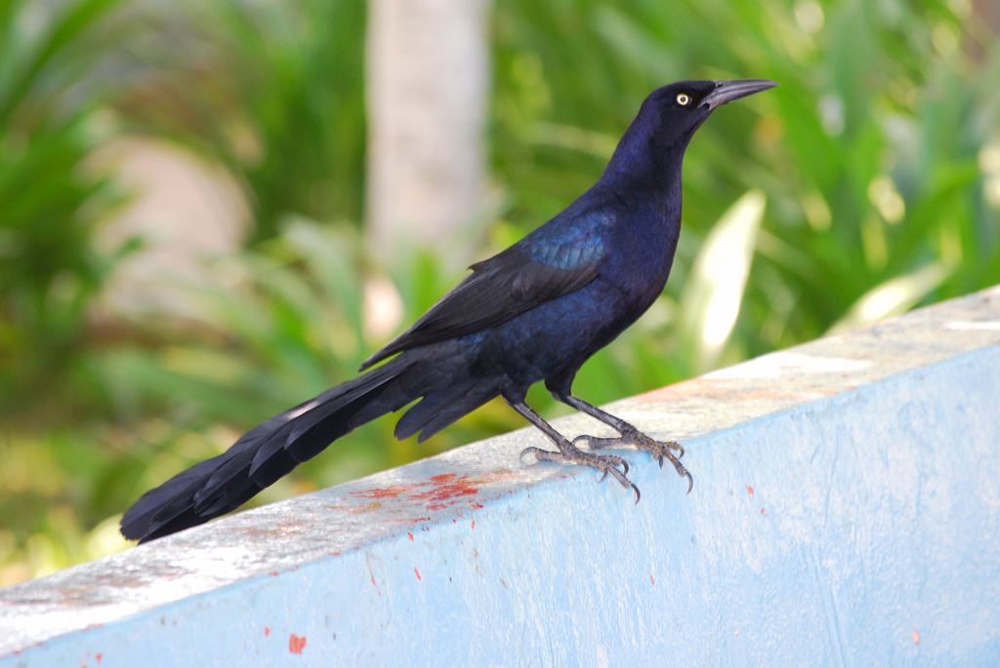

Index: 1
Image URL: https://i.pinimg.com/736x/a8/d4/30/a8d430e8b24249577d09ea0a9c4bec54.jpg

Caption (truncated):
This nighttime image captures a dynamic point of view from a motorcycle rider on a dimly lit street,
giving a sense of motion and speed. The viewer sees the motorcycle's handlebars and front dash,
including a prominent circular speedometer and a smaller gas gauge, with a key inserted in the
ignition, attached to a brown leather key holder. The handlebar details and top of the seat are
slightly cut...


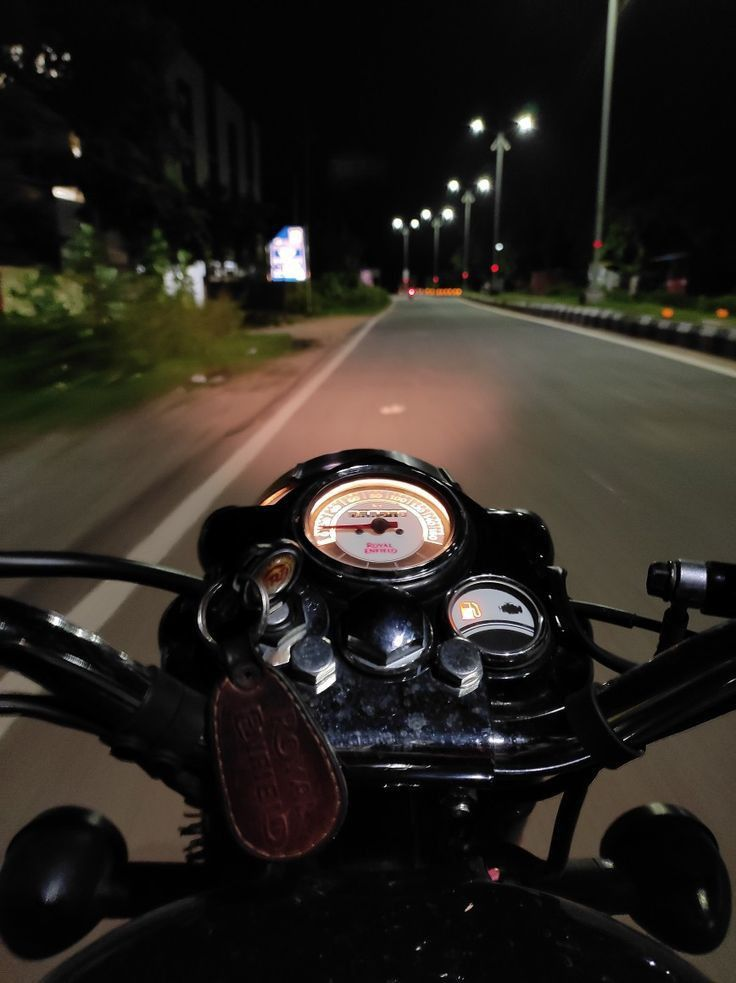

Index: 2
Image URL: https://i.redd.it/tujlim4fvo2d1.png

Caption (truncated):
The image showcases a dynamic, animated scene featuring four distinct characters, each housed within
a large, square framing composed of a purple and lilac outer border.   1. The first character,
located in the upper left corner, is an anthropomorphic creature with a purple body and a striking
face that blends black and pink hues, complemented by blue and pink hair. This character stands on
its hi...


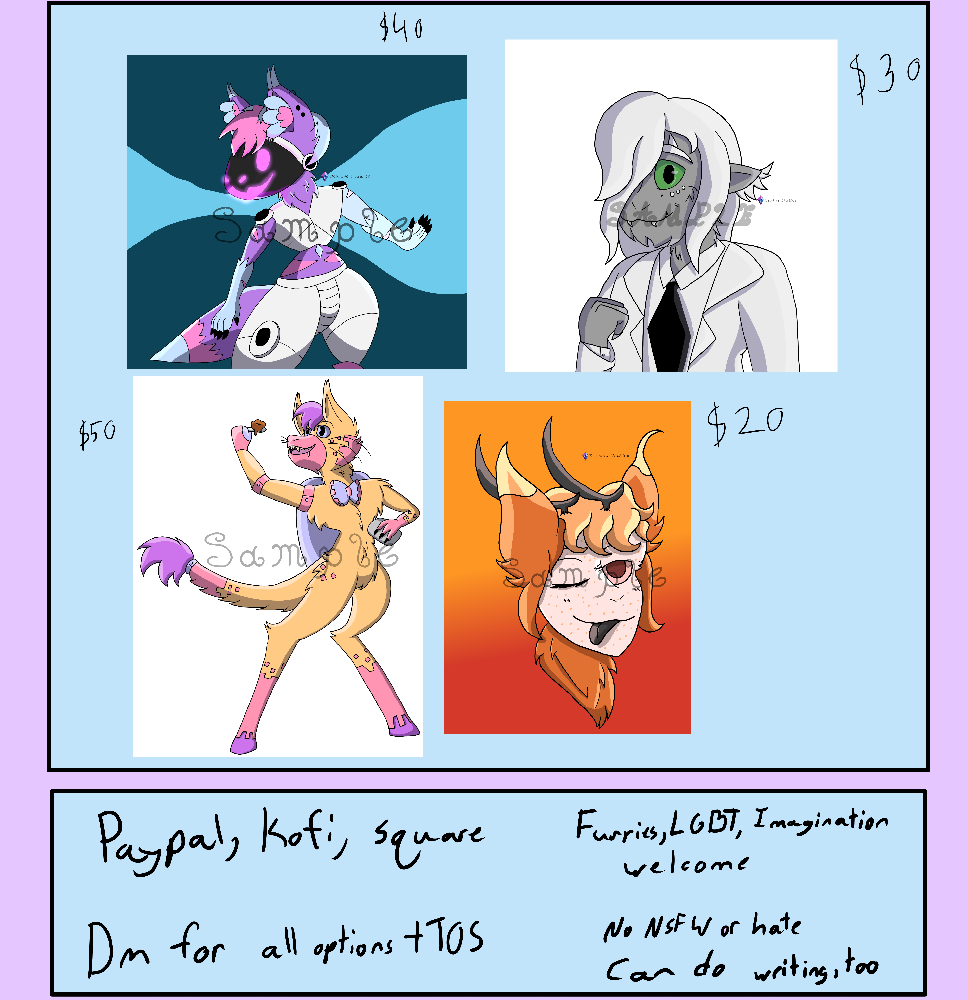

In [16]:
# Part 3.4 – Visual sanity check: show a few (image, caption) pairs

from PIL import Image
import requests
from io import BytesIO
import textwrap

def fetch_image_from_url(url: str) -> Image.Image:
    resp = requests.get(url, timeout=10)
    resp.raise_for_status()
    img = Image.open(BytesIO(resp.content)).convert("RGB")
    return img

def show_example(idx: int, dataset):
    ex = dataset[idx]
    print(f"Index: {idx}")
    print("Image URL:", ex["image_url"])
    print("\nCaption (truncated):")
    print(textwrap.fill(ex["caption"][:400] + ("..." if len(ex["caption"]) > 400 else ""), width=100))
    
    try:
        img = fetch_image_from_url(ex["image_url"])
        display(img)
    except Exception as e:
        print("⚠️ Could not fetch image:", e)

for i in range(3):
    show_example(i, pixmo_train)
    print("=" * 120)


In [17]:
# Part 3.5 – Simple accessor helpers (for clarity, not strictly required)

def get_image_url(ex):
    return ex["image_url"]

def get_caption(ex):
    # Optionally clean or truncate here
    return ex["caption"].strip()


In [18]:
# Part 3.6 – Caption tokenization stats (on a small sample)

def caption_length_in_tokens(ex):
    tokens = llm_tokenizer(
        ex["caption"],
        truncation=True,
        max_length=512,  # we can tune this later
    )["input_ids"]
    return {"caption_len_tokens": len(tokens)}

sample_for_stats = pixmo_train.select(range(min(1000, len(pixmo_train))))
sample_with_len = sample_for_stats.map(caption_length_in_tokens)

lengths = [ex["caption_len_tokens"] for ex in sample_with_len]
print("Token length stats on sample of", len(lengths))
print("  min:", int(np.min(lengths)))
print("  max:", int(np.max(lengths)))
print("  mean:", float(np.mean(lengths)))
print("  90th percentile:", float(np.percentile(lengths, 90)))


Token length stats on sample of 1000
  min: 82
  max: 512
  mean: 247.864
  90th percentile: 349.0


### Part- 4: - 

In [19]:
# Part 4.2.1 – Fetch image from URL (reusable)

import requests
from io import BytesIO
from PIL import Image

def fetch_image(url: str) -> Image.Image:
    resp = requests.get(url, timeout=10)
    resp.raise_for_status()
    img = Image.open(BytesIO(resp.content)).convert("RGB")
    return img


In [20]:
# Part 4.2.2 – Encode image -> patch features (concatenate 2nd & 2nd-to-last layers)

def encode_image_to_patches(img: Image.Image) -> torch.Tensor:
    """
    img: PIL.Image
    returns: torch.Tensor of shape (num_patches, feat_dim_concat) on CPU
    """
    # Preprocess for the vision encoder
    inputs = vision_processor(images=img, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = vision_model(**inputs)
        hidden_states = outputs.hidden_states  # tuple of length (num_layers + 1)

    # Safety check
    num_layers_plus_embed = len(hidden_states)
    if num_layers_plus_embed < 4:
        raise ValueError(f"Not enough layers ({num_layers_plus_embed}) to take 2nd and 2nd-to-last.")

    # hidden_states[1] -> 2nd (after first block)
    # hidden_states[-2] -> 2nd-to-last block output
    h_low  = hidden_states[1]    # (B, seq_len, D)
    h_high = hidden_states[-2]   # (B, seq_len, D)

    # Drop CLS token (assumed at position 0)
    h_low_patches  = h_low[:, 1:, :]    # (B, num_patches, D)
    h_high_patches = h_high[:, 1:, :]   # (B, num_patches, D)

    # Concatenate along feature dim
    feats = torch.cat([h_low_patches, h_high_patches], dim=-1)  # (B, num_patches, 2D)

    # Remove batch dim and move to CPU, cast to float16 to save space
    feats = feats[0].to(torch.float16).cpu()  # (num_patches, 2D)

    return feats


In [21]:
# Update perceiver_dim based on concatenated feature dim (2 * hidden_size)
vision_hidden_size = vision_model.config.hidden_size
cfg.perceiver_dim = 2 * vision_hidden_size
print("Updated perceiver_dim to:", cfg.perceiver_dim)


Updated perceiver_dim to: 1536


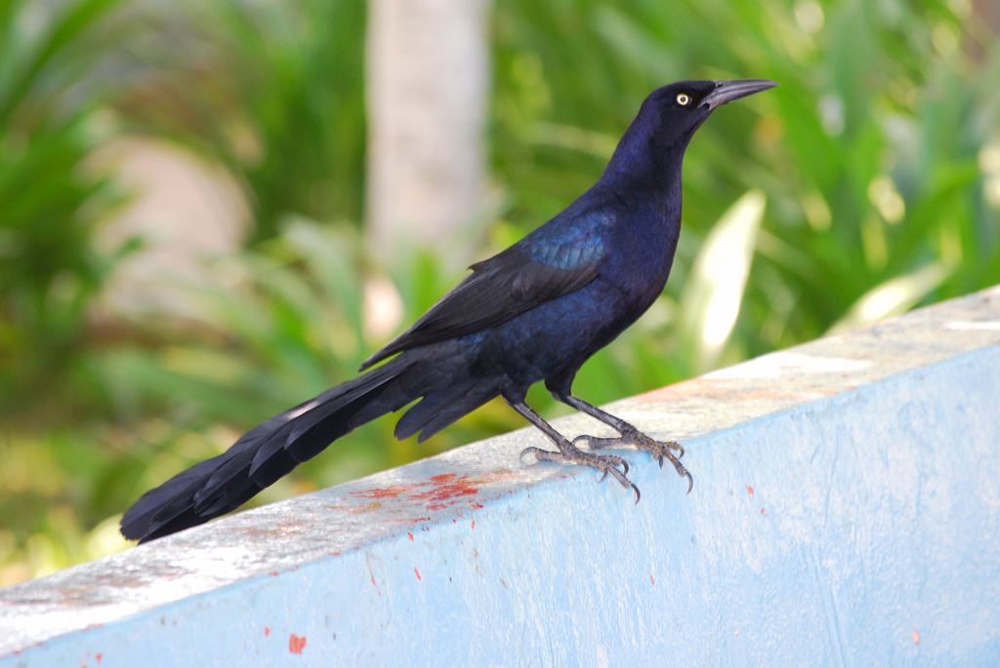

Caption: This photograph depicts a striking black bird, possibly a grackle or similar species, perched on a white cement wall with red stains. The bird's sleek, elongated body is adorned with iridescent feathe ...
Patch features shape: torch.Size([256, 1536])
num_patches: 256
feat_dim: 1536


In [22]:
# Part 4.2.3 – Sanity check: run encode_image_to_patches on one PixMo example

test_ex = pixmo_train[0]
test_img = fetch_image(test_ex["image_url"])
display(test_img)
print("Caption:", test_ex["caption"][:200], "...")

test_feats = encode_image_to_patches(test_img)
print("Patch features shape:", test_feats.shape)  # (num_patches, feat_dim)
print("num_patches:", test_feats.shape[0])
print("feat_dim:", test_feats.shape[1])


In [23]:
# Part 4.3.1 – Helper to process and save one example

import json

def process_and_save_example(ex, idx: int, split_name: str):
    """
    ex: dataset example from pixmo_train or pixmo_val
    idx: original index in that split
    split_name: "train" or "val"
    returns: dict with metadata if success, None if failure
    """
    url = ex["image_url"]
    caption = ex["caption"].strip()

    try:
        img = fetch_image(url)
        feats = encode_image_to_patches(img)  # (num_patches, feat_dim)
    except Exception as e:
        print(f"[{split_name}] Skipping idx={idx} due to error:", e)
        return None

    # Build save path
    fname = f"{split_name}_feat_{idx}.pt"
    fpath = cfg.features_dir / fname

    torch.save(
        {
            "features": feats,     # (num_patches, feat_dim), float16
            "caption": caption,    # raw text
            "image_url": url,
            "orig_idx": idx,
        },
        fpath,
    )

    return {
        "orig_idx": idx,
        "file": str(fpath),
        "num_patches": feats.shape[0],
        "feat_dim": feats.shape[1],
    }


In [24]:
# # Part 4.3.2 – Extract & cache features for train split

# train_index = []
# for i, ex in enumerate(tqdm(pixmo_train, desc="Extracting train features")):
#     meta = process_and_save_example(ex, idx=i, split_name="train")
#     if meta is not None:
#         train_index.append(meta)

# train_index_path = cfg.root_dir / "train_index.json"
# with open(train_index_path, "w") as f:
#     json.dump(train_index, f, indent=2)

# print(f"Saved train index with {len(train_index)} items to {train_index_path}")


In [25]:
import json
from multiprocessing.dummy import Pool as ThreadPool  # thread-based Pool
from multiprocessing import cpu_count
from tqdm import tqdm

def _process_train_example(args):
    i, ex = args
    # process_and_save_example must be defined in some cell above
    return process_and_save_example(ex, idx=i, split_name="train")

def build_train_index_threaded(pixmo_train, cfg, workers=None, chunksize=32):
    """
    Extract & cache features for the train split using a thread pool.
    Works well inside Jupyter.
    """
    if workers is None:
        workers = min(8, cpu_count())

    # If pixmo_train supports len(), use it for a nice progress bar
    try:
        total = len(pixmo_train)
    except TypeError:
        total = None

    tasks = ((i, ex) for i, ex in enumerate(pixmo_train))

    train_index = []

    with ThreadPool(processes=workers) as pool:
        for meta in tqdm(
            pool.imap_unordered(_process_train_example, tasks, chunksize=chunksize),
            total=total,
            desc="Extracting train features (threads)",
        ):
            if meta is not None:
                train_index.append(meta)

    train_index_path = cfg.root_dir / "train_index.json"
    with open(train_index_path, "w") as f:
        json.dump(train_index, f, indent=2)

    print(f"Saved train index with {len(train_index)} items to {train_index_path}")


# Call this in your notebook:
# build_train_index_threaded(pixmo_train, cfg, workers=4)


In [26]:
# # Part 4.3.3 – Extract & cache features for val split

# val_index = []
# for i, ex in enumerate(tqdm(pixmo_val, desc="Extracting val features")):
#     meta = process_and_save_example(ex, idx=i, split_name="val")
#     if meta is not None:
#         val_index.append(meta)

# val_index_path = cfg.root_dir / "val_index.json"
# with open(val_index_path, "w") as f:
#     json.dump(val_index, f, indent=2)

# print(f"Saved val index with {len(val_index)} items to {val_index_path}")


In [27]:
import json
from multiprocessing.dummy import Pool as ThreadPool  # threads, Jupyter-friendly
from multiprocessing import cpu_count
from tqdm import tqdm

def _process_example(args):
    i, ex, split_name = args
    # process_and_save_example must already be defined above
    return process_and_save_example(ex, idx=i, split_name=split_name)

def build_split_index_threaded(dataset, split_name, cfg, workers=None, chunksize=32):
    """
    Extract & cache features for a given split using threads.
    split_name: "train", "val", "test", ...
    """
    if workers is None:
        workers = min(8, cpu_count())

    # Try to get length for tqdm progress
    try:
        total = len(dataset)
    except TypeError:
        total = None

    tasks = ((i, ex, split_name) for i, ex in enumerate(dataset))

    split_index = []

    with ThreadPool(processes=workers) as pool:
        for meta in tqdm(
            pool.imap_unordered(_process_example, tasks, chunksize=chunksize),
            total=total,
            desc=f"Extracting {split_name} features (threads)",
        ):
            if meta is not None:
                split_index.append(meta)

    index_path = cfg.root_dir / f"{split_name}_index.json"
    with open(index_path, "w") as f:
        json.dump(split_index, f, indent=2)

    print(f"Saved {split_name} index with {len(split_index)} items to {index_path}")
    return split_index

# val_index = build_split_index_threaded(pixmo_val, "val", cfg)

In [28]:
import json

index_path = cfg.root_dir / "train_index.json"

with open(index_path, "r") as f:
    train_index = json.load(f)

print("Loaded", len(train_index), "items")


Loaded 4367 items


In [29]:
with open(cfg.root_dir / "val_index.json", "r") as f:
    val_index = json.load(f)


In [30]:
# Part 4.3.4 – Check one cached feature file

if len(train_index) > 0:
    first_meta = train_index[0]
    print("First meta:", first_meta)

    sample_path = first_meta["file"]
    blob = torch.load(sample_path)
    feats = blob["features"]
    caption = blob["caption"]
    print("Loaded features shape:", feats.shape)
    print("Caption snippet:", caption[:200], "...")
else:
    print("No train examples cached – check earlier logs for errors.")


First meta: {'orig_idx': 96, 'file': 'perceiver_alignment_experiment/features/train_feat_96.pt', 'num_patches': 256, 'feat_dim': 1536}
Loaded features shape: torch.Size([256, 1536])
Caption snippet: The image depicts a pixelated, retro-style space shooter game set against a night sky backdrop. At the bottom center of the screen, a player-controlled spaceship is visible, continuously firing small  ...


### Part-5: - Perciever Sampler

In [31]:
# Part 5.1 – QK-normalized multi-head cross attention

class QKNormCrossAttention(nn.Module):
    def __init__(self, dim: int, num_heads: int = 8, attn_dropout: float = 0.0):
        super().__init__()
        assert dim % num_heads == 0, "dim must be divisible by num_heads"
        self.dim = dim
        self.num_heads = num_heads
        self.head_dim = dim // num_heads
        self.scale = self.head_dim ** -0.5

        # Projections
        self.q_proj = nn.Linear(dim, dim)
        self.k_proj = nn.Linear(dim, dim)
        self.v_proj = nn.Linear(dim, dim)
        self.out_proj = nn.Linear(dim, dim)

        # QK norm: LayerNorm on Q and K before dot product
        self.q_ln = nn.LayerNorm(dim)
        self.k_ln = nn.LayerNorm(dim)

        self.attn_dropout = nn.Dropout(attn_dropout)

    def forward(self, latents, encoder_feats, encoder_mask=None):
        """
        latents: (B, L, D)     - queries
        encoder_feats: (B, T, D) - keys/values
        encoder_mask: (B, T) bool or 0/1, 1=keep, 0=pad  (optional)
        returns: (B, L, D)
        """
        B, L, D = latents.shape
        _, T, _ = encoder_feats.shape

        # Project to Q, K, V
        q = self.q_proj(latents)        # (B, L, D)
        k = self.k_proj(encoder_feats)  # (B, T, D)
        v = self.v_proj(encoder_feats)  # (B, T, D)

        # QK norm (LayerNorm; optionally could add L2 norm if needed)
        q = self.q_ln(q)
        k = self.k_ln(k)

        # Reshape for multi-head attention: (B, H, L, head_dim)
        q = q.view(B, L, self.num_heads, self.head_dim).transpose(1, 2)  # (B, H, L, Dh)
        k = k.view(B, T, self.num_heads, self.head_dim).transpose(1, 2)  # (B, H, T, Dh)
        v = v.view(B, T, self.num_heads, self.head_dim).transpose(1, 2)  # (B, H, T, Dh)

        # Attention scores: (B, H, L, T)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) * self.scale

        if encoder_mask is not None:
            # encoder_mask: (B, T) -> (B, 1, 1, T)
            mask = encoder_mask[:, None, None, :].to(dtype=attn_scores.dtype)
            # Use very negative value to mask
            attn_scores = attn_scores.masked_fill(mask == 0, float("-1e9"))

        attn_weights = torch.softmax(attn_scores, dim=-1)
        attn_weights = self.attn_dropout(attn_weights)

        # Weighted sum: (B, H, L, Dh)
        attn_output = torch.matmul(attn_weights, v)

        # Merge heads back: (B, L, D)
        attn_output = attn_output.transpose(1, 2).contiguous().view(B, L, D)

        # Final projection
        out = self.out_proj(attn_output)
        return out


In [32]:
# Part 5.2 – Perceiver block = cross-attn + MLP, both with residual + LayerNorm

class PerceiverBlock(nn.Module):
    def __init__(self, dim: int, num_heads: int = 8, mlp_ratio: float = 4.0, attn_dropout: float = 0.0, mlp_dropout: float = 0.0):
        super().__init__()
        self.cross_attn = QKNormCrossAttention(dim=dim, num_heads=num_heads, attn_dropout=attn_dropout)
        self.ln1 = nn.LayerNorm(dim)

        hidden_dim = int(dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(mlp_dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(mlp_dropout),
        )
        self.ln2 = nn.LayerNorm(dim)

    def forward(self, latents, encoder_feats, encoder_mask=None):
        """
        latents: (B, L, D)
        encoder_feats: (B, T, D)
        encoder_mask: (B, T) or None
        """
        # Cross-attention: latents attend to encoder tokens
        attn_out = self.cross_attn(latents, encoder_feats, encoder_mask=encoder_mask)
        latents = latents + attn_out
        latents = self.ln1(latents)

        # MLP
        mlp_out = self.mlp(latents)
        latents = latents + mlp_out
        latents = self.ln2(latents)

        return latents


In [33]:
# Part 5.3 – PerceiverResampler with learnable latents

class PerceiverResampler(nn.Module):
    def __init__(
        self,
        dim: int,
        num_latents: int,
        num_layers: int = 2,
        num_heads: int = 8,
        attn_dropout: float = 0.0,
        mlp_dropout: float = 0.0,
        mlp_ratio: float = 4.0,
    ):
        super().__init__()
        self.dim = dim
        self.num_latents = num_latents

        # Learnable latent queries: (num_latents, dim)
        self.latents_param = nn.Parameter(torch.randn(num_latents, dim) * 0.02)

        # Stack of PerceiverBlocks
        self.layers = nn.ModuleList(
            [
                PerceiverBlock(
                    dim=dim,
                    num_heads=num_heads,
                    mlp_ratio=mlp_ratio,
                    attn_dropout=attn_dropout,
                    mlp_dropout=mlp_dropout,
                )
                for _ in range(num_layers)
            ]
        )

    def forward(self, encoder_feats, encoder_mask=None):
        """
        encoder_feats: (B, T, D)
        encoder_mask: (B, T) or None
        returns: (B, num_latents, D)
        """
        B, T, D = encoder_feats.shape
        assert D == self.dim, f"Encoder dim {D} != Perceiver dim {self.dim}"

        # Initialize latents for this batch: (B, L, D)
        latents = self.latents_param[None, :, :].expand(B, self.num_latents, self.dim)

        for layer in self.layers:
            latents = layer(latents, encoder_feats, encoder_mask=encoder_mask)

        return latents


In [34]:
# Part 5.4 – Create PerceiverResampler instance

perceiver = PerceiverResampler(
    dim=cfg.perceiver_dim,
    num_latents=cfg.num_latents,
    num_layers=cfg.num_perceiver_layers,
    num_heads=cfg.num_attn_heads,
    attn_dropout=0.0,
    mlp_dropout=0.0,
)

perceiver.to(device)

# Only Perceiver (and later projector) will be trainable
trainable_params = sum(p.numel() for p in perceiver.parameters() if p.requires_grad)
print(f"PerceiverResampler trainable params: {trainable_params / 1e6:.3f}M")


PerceiverResampler trainable params: 56.774M


In [35]:
# Part 5.5 – Sanity check: forward pass on one cached feature

import json

# Load index if not already in memory
train_index_path = cfg.root_dir / "train_index.json"
with open(train_index_path, "r") as f:
    train_index = json.load(f)

if len(train_index) == 0:
    print("No examples in train_index – ensure Phase-4 ran successfully.")
else:
    meta0 = train_index[0]
    print("Using cached example:", meta0)

    blob = torch.load(meta0["file"])
    feats = blob["features"]          # (num_patches, feat_dim)
    caption = blob["caption"]
    feats = feats.to(device=device, dtype=torch.float32)

    print("Original feats shape:", feats.shape)
    print("Caption snippet:", caption[:200], "...")

    # Add batch dim and move to device
    encoder_feats = feats.unsqueeze(0).to(device)  # (1, T, D)
    encoder_mask = torch.ones(1, encoder_feats.shape[1], dtype=torch.long, device=device)  # no padding yet

    with torch.no_grad():
        latents_out = perceiver(encoder_feats, encoder_mask=encoder_mask)

    print("Perceiver output shape:", latents_out.shape)  # expect (1, num_latents, cfg.perceiver_dim)
    print("num_latents:", latents_out.shape[1])
    print("latent dim:", latents_out.shape[2])

    # Quick norm stats
    norms = latents_out.norm(dim=-1).mean().item()
    print("Average latent L2 norm:", norms)


Using cached example: {'orig_idx': 96, 'file': 'perceiver_alignment_experiment/features/train_feat_96.pt', 'num_patches': 256, 'feat_dim': 1536}
Original feats shape: torch.Size([256, 1536])
Caption snippet: The image depicts a pixelated, retro-style space shooter game set against a night sky backdrop. At the bottom center of the screen, a player-controlled spaceship is visible, continuously firing small  ...
Perceiver output shape: torch.Size([1, 64, 1536])
num_latents: 64
latent dim: 1536
Average latent L2 norm: 39.191650390625


### Part-6: - Alignment


In [36]:
# Part 6.1 – Image → LLM space projector

class ImageToLLMProjector(nn.Module):
    def __init__(self, in_dim: int, out_dim: int):
        super().__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        # Optional: you can add LayerNorm here later if needed
        # self.norm = nn.LayerNorm(out_dim)

    def forward(self, latents):
        """
        latents: (B, num_latents, in_dim)
        returns: (B, num_latents, out_dim)
        """
        x = self.proj(latents)
        # x = self.norm(x)  # uncomment if you add LayerNorm
        return x


In [37]:
# Instantiate the projector with Perceiver dim -> LLM hidden size

projector = ImageToLLMProjector(
    in_dim=cfg.perceiver_dim,
    out_dim=llm_hidden_size,
).to(device)

trainable_params_proj = sum(p.numel() for p in projector.parameters() if p.requires_grad)
print(f"Projector trainable params: {trainable_params_proj / 1e6:.3f}M")


Projector trainable params: 3.148M


In [38]:
# Part 6.2 – Test full pipeline: encoder_features -> Perceiver -> Projector

import json

# Ensure we have the train index loaded
train_index_path = cfg.root_dir / "train_index.json"
with open(train_index_path, "r") as f:
    train_index = json.load(f)

if len(train_index) == 0:
    print("No cached features – make sure Phase-4 succeeded.")
else:
    meta0 = train_index[0]
    blob = torch.load(meta0["file"])
    feats = blob["features"]          # (num_patches, cfg.perceiver_dim)
    caption = blob["caption"]
    feats = feats.to(device=device, dtype=torch.float32)
    
    print("Loaded features shape:", feats.shape)
    print("Caption snippet:", caption[:200], "...")

    # Prepare batch of size 1
    encoder_feats = feats.unsqueeze(0).to(device)  # (1, T, D)
    encoder_mask = torch.ones(1, encoder_feats.shape[1], dtype=torch.long, device=device)

    with torch.no_grad():
        latents = perceiver(encoder_feats, encoder_mask=encoder_mask)  # (1, L, D_perc)
        image_tokens_llm = projector(latents)                           # (1, L, D_llm)

    print("Perceiver latents shape:", latents.shape)
    print("Projected image tokens shape:", image_tokens_llm.shape)
    print("num_latents:", image_tokens_llm.shape[1])
    print("llm_dim:", image_tokens_llm.shape[2])


Loaded features shape: torch.Size([256, 1536])
Caption snippet: The image depicts a pixelated, retro-style space shooter game set against a night sky backdrop. At the bottom center of the screen, a player-controlled spaceship is visible, continuously firing small  ...
Perceiver latents shape: torch.Size([1, 64, 1536])
Projected image tokens shape: torch.Size([1, 64, 2048])
num_latents: 64
llm_dim: 2048


In [39]:
# Part 6.3 – Norm comparison: LLM text embeddings vs image tokens

with torch.no_grad():
    # 1. Sample some random token IDs
    vocab_size = llm_model.get_input_embeddings().weight.shape[0]
    num_samples = 1024
    random_ids = torch.randint(0, vocab_size, (num_samples,), device=device)
    text_embs = llm_model.get_input_embeddings()(random_ids)  # (num_samples, D_llm)

    text_norms = text_embs.norm(dim=-1).detach().cpu().numpy()

    # 2. Use image_tokens_llm from previous cell (shape: (1, L, D_llm))
    img_embs = image_tokens_llm[0]  # (L, D_llm)
    img_norms = img_embs.norm(dim=-1).detach().cpu().numpy()

print("Text embedding norms:  mean={:.3f}, std={:.3f}".format(text_norms.mean(), text_norms.std()))
print("Image token norms:     mean={:.3f}, std={:.3f}".format(img_norms.mean(), img_norms.std()))


Text embedding norms:  mean=0.669, std=0.095
Image token norms:     mean=26.891, std=0.155


In [40]:
# Part 6.4 – Helper to collect trainable params (Perceiver + Projector + special tokens)

def get_trainable_params():
    params = []
    # Perceiver
    params += list(perceiver.parameters())
    # Projector
    params += list(projector.parameters())

    # (Optional) If you want to finetune the new special token embeddings:
    # emb = llm_model.get_input_embeddings()
    # special_ids = [image_start_id, image_end_id, image_patch_id]
    # But selectively training only some rows is more complex; easiest POC is to keep LLM fully frozen.

    return [p for p in params if p.requires_grad]

all_trainable = get_trainable_params()
print("Total trainable params (Perceiver + Projector): {:.3f}M".format(
    sum(p.numel() for p in all_trainable) / 1e6
))


Total trainable params (Perceiver + Projector): 59.921M


### Part-7

In [46]:
# Part 7.1 – Dataset for cached vision features + captions

import json
from torch.utils.data import Dataset

class PixmoFeaturesDataset(Dataset):
    def __init__(self, index_path: Path):
        super().__init__()
        with open(index_path, "r") as f:
            self.index = json.load(f)

    def __len__(self):
        return len(self.index)

    def __getitem__(self, idx):
        meta = self.index[idx]
        blob = torch.load(meta["file"])
        feats = blob["features"]      # (num_patches, cfg.perceiver_dim), float16
        caption = blob["caption"].strip()
        return {
            "features": feats,        # torch.Tensor
            "caption": caption,       # str
        }

train_index_path = cfg.root_dir / "train_index.json"
val_index_path   = cfg.root_dir / "val_index.json"

train_dataset = PixmoFeaturesDataset(train_index_path)
val_dataset   = PixmoFeaturesDataset(val_index_path)

print("Train dataset size:", len(train_dataset))
print("Val dataset size:", len(val_dataset))


Train dataset size: 4367
Val dataset size: 450


In [47]:
# Part 7.2 – Build multimodal token sequence for a single example

bos_id = llm_tokenizer.bos_token_id if llm_tokenizer.bos_token_id is not None else llm_tokenizer.eos_token_id
eos_id = llm_tokenizer.eos_token_id

def build_multimodal_sequence(caption: str, num_latents: int):
    """
    Returns:
      input_ids: List[int]
      labels:    List[int] (with -100 for non-caption positions)
    """
    # 1. Tokenize caption WITHOUT adding special tokens (we handle BOS/EOS manually)
    cap_enc = llm_tokenizer(
        caption,
        add_special_tokens=False,
        truncation=True,
        max_length=512,    # can adjust if you want longer captions
    )
    caption_ids = cap_enc["input_ids"]

    # 2. Build sequence: [BOS] <image_start> <image_patch> * L <image_end> caption [EOS]
    seq = []
    seq.append(bos_id)
    seq.append(image_start_id)
    seq.extend([image_patch_id] * num_latents)
    seq.append(image_end_id)
    seq.extend(caption_ids)
    seq.append(eos_id)

    input_ids = seq

    # 3. Build labels: ignore non-caption positions
    labels = []
    for i, tid in enumerate(input_ids):
        # Caption tokens start after: BOS, image_start, image_patch x L, image_end
        if i < 2 + num_latents + 1:   # indices: 0=BOS, 1=start, [2..(1+L)]=patches, (2+L)=end
            labels.append(-100)
        else:
            # For EOS we could also ignore if we don't care; here we include it
            labels.append(tid)

    assert len(input_ids) == len(labels)
    return input_ids, labels


In [48]:
# Quick sanity check for a single caption

example = train_dataset[0]
test_caption = example["caption"]

ids, lbls = build_multimodal_sequence(test_caption, num_latents=cfg.num_latents)
tokens = llm_tokenizer.convert_ids_to_tokens(ids)

print("Sequence length:", len(ids))
print("First 20 tokens:", tokens[:20])
print("First 20 labels:", lbls[:20])
print("Number of caption tokens with labels != -100:", sum(l != -100 for l in lbls))


Sequence length: 222
First 20 tokens: ['<s>', '<image_start>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>']
First 20 labels: [-100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100]
Number of caption tokens with labels != -100: 155


In [49]:
# Part 7.3 – Collate function for DataLoader

def collate_pixmo_batch(batch, num_latents: int):
    """
    batch: list of dicts from PixmoFeaturesDataset
      each has:
        - features: (T_i, D)
        - caption: str
    Returns a dict with:
        - encoder_feats: (B, T_max, D)
        - encoder_mask:  (B, T_max)
        - input_ids:     (B, L_max)
        - attention_mask:(B, L_max)
        - labels:        (B, L_max)
    """
    batch_size = len(batch)

    # ---- Vision side: pad features along time dim ----
    feats_list = [ex["features"] for ex in batch]        # list of (T_i, D)
    lengths_T = [f.shape[0] for f in feats_list]
    D = feats_list[0].shape[1]
    T_max = max(lengths_T)

    encoder_feats = torch.zeros(batch_size, T_max, D, dtype=torch.float16)
    encoder_mask  = torch.zeros(batch_size, T_max, dtype=torch.long)

    for i, feats in enumerate(feats_list):
        T_i = feats.shape[0]
        encoder_feats[i, :T_i] = feats
        encoder_mask[i, :T_i] = 1   # 1 = real, 0 = pad

    # ---- Text side: build multimodal sequences and pad ----
    all_input_ids = []
    all_labels    = []

    for ex in batch:
        cap = ex["caption"]
        ids, lbls = build_multimodal_sequence(cap, num_latents=num_latents)
        all_input_ids.append(ids)
        all_labels.append(lbls)

    lengths_L = [len(ids) for ids in all_input_ids]
    L_max = max(lengths_L)

    input_ids = torch.full((batch_size, L_max), llm_tokenizer.pad_token_id, dtype=torch.long)
    labels    = torch.full((batch_size, L_max), -100, dtype=torch.long)
    attention_mask = torch.zeros((batch_size, L_max), dtype=torch.long)

    for i, (ids, lbls) in enumerate(zip(all_input_ids, all_labels)):
        L_i = len(ids)
        input_ids[i, :L_i] = torch.tensor(ids, dtype=torch.long)
        labels[i, :L_i]    = torch.tensor(lbls, dtype=torch.long)
        attention_mask[i, :L_i] = 1

    batch_out = {
        "encoder_feats": encoder_feats,   # (B, T_max, D), float16 on CPU for now
        "encoder_mask": encoder_mask,     # (B, T_max)
        "input_ids": input_ids,           # (B, L_max)
        "attention_mask": attention_mask, # (B, L_max)
        "labels": labels,                 # (B, L_max)
    }
    return batch_out


In [50]:
from torch.utils.data import DataLoader

train_loader = DataLoader(
    train_dataset,
    batch_size=cfg.batch_size,
    shuffle=True,
    collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
)

batch = next(iter(train_loader))
print("encoder_feats:", batch["encoder_feats"].shape)
print("encoder_mask:", batch["encoder_mask"].shape)
print("input_ids:", batch["input_ids"].shape)
print("attention_mask:", batch["attention_mask"].shape)
print("labels:", batch["labels"].shape)

# Inspect one sequence (first in batch)
i = 0
ids_row = batch["input_ids"][i].tolist()
tokens_row = llm_tokenizer.convert_ids_to_tokens(ids_row)
labels_row = batch["labels"][i].tolist()

print("\nDecoded tokens (first 40):")
print(tokens_row[:40])
print("\nLabels (first 40):")
print(labels_row[:40])


encoder_feats: torch.Size([8, 256, 1536])
encoder_mask: torch.Size([8, 256])
input_ids: torch.Size([8, 499])
attention_mask: torch.Size([8, 499])
labels: torch.Size([8, 499])

Decoded tokens (first 40):
['<s>', '<image_start>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>', '<image_patch>']

Labels (first 40):
[-100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -100, -10

In [68]:
# Part 7.4 – Inject projected image tokens into LLM embeddings

def inject_image_embeddings(input_ids: torch.Tensor, image_tokens_llm: torch.Tensor):
    """
    input_ids:        (B, L)              -- token ids, dtype long
    image_tokens_llm: (B, num_latents, D) -- projected image tokens in LLM hidden dim

    returns:
        inputs_embeds: (B, L, D) with <image_patch> positions replaced by image_tokens_llm
    """
    B, L = input_ids.shape
    B2, num_latents, D = image_tokens_llm.shape
    assert B == B2, "Batch size mismatch between input_ids and image_tokens_llm"

    # 1. Get base token embeddings from the LLM
    embed_tokens = llm_model.get_input_embeddings()
    # Make sure input_ids are on the same device as the embedding weights
    embed_device = embed_tokens.weight.device
    base_embeds = embed_tokens(input_ids.to(embed_device))  # (B, L, D)

    # 🔑 1.5 Ensure image_tokens_llm matches dtype & device of base_embeds
    image_tokens_llm = image_tokens_llm.to(device=base_embeds.device, dtype=base_embeds.dtype)

    # Work on a clone so we don't mutate base_embeds in place if we don't want to
    inputs_embeds = base_embeds.clone()

    # 2. Replace <image_patch> token embeddings
    for b in range(B):
        row_ids = input_ids[b].to(embed_device)  # (L,)
        patch_positions = (row_ids == image_patch_id).nonzero(as_tuple=False).squeeze(-1)  # (num_patch_positions,)

        if patch_positions.numel() == 0:
            # No image patches for this example (can happen if some prompts are text-only)
            continue

        if patch_positions.numel() != num_latents:
            raise ValueError(
                f"Example {b} has {patch_positions.numel()} <image_patch> tokens, "
                f"but num_latents={num_latents}"
            )

        # Overwrite embeddings at those positions with image_tokens_llm[b]
        inputs_embeds[b, patch_positions, :] = image_tokens_llm[b]

    return inputs_embeds


In [69]:
# Part 7.5 – Test the injection pipeline on one mini-batch

batch = next(iter(train_loader))

# Move vision features + masks + ids to device
encoder_feats_batch = batch["encoder_feats"].to(device, dtype=torch.float32)  # 🔑 force fp32
encoder_mask_batch  = batch["encoder_mask"].to(device)                        # long is fine
input_ids_batch     = batch["input_ids"].to(device)                           # keep as long, NOT float

# Also make sure perceiver + projector are float32 and on device
perceiver = perceiver.to(device, dtype=torch.float32)
projector = projector.to(device, dtype=torch.float32)

print("encoder_feats_batch shape:", encoder_feats_batch.shape, encoder_feats_batch.dtype)
print("encoder_mask_batch shape:", encoder_mask_batch.shape, encoder_mask_batch.dtype)
print("input_ids_batch shape:", input_ids_batch.shape, input_ids_batch.dtype)

# Perceiver -> Projector
with torch.no_grad():
    latents_batch = perceiver(
        encoder_feats_batch,
        encoder_mask=encoder_mask_batch,
    )  # (B, num_latents, cfg.perceiver_dim)

    image_tokens_llm_batch = projector(latents_batch)  # (B, num_latents, llm_hidden_size)

# Ensure image tokens are float32 for LLM embeddings
image_tokens_llm_batch = image_tokens_llm_batch.to(torch.float32)


inputs_embeds_batch = inject_image_embeddings(input_ids_batch, image_tokens_llm_batch)
print("inputs_embeds_batch shape:", inputs_embeds_batch.shape)

# Check that <image_patch> positions actually changed:
b0 = 0
patch_positions_b0 = (input_ids_batch[b0] == image_patch_id).nonzero(as_tuple=False).squeeze(-1)
print("Patch positions for sample 0:", patch_positions_b0)

print("Embeds at first patch position (first 5 dims):")
print(inputs_embeds_batch[b0, patch_positions_b0[0], :5])
print("Corresponding latent (first 5 dims):")
print(image_tokens_llm_batch[b0, 0, :5])


encoder_feats_batch shape: torch.Size([8, 256, 1536]) torch.float32
encoder_mask_batch shape: torch.Size([8, 256]) torch.int64
input_ids_batch shape: torch.Size([8, 481]) torch.int64
inputs_embeds_batch shape: torch.Size([8, 481, 2048])
Patch positions for sample 0: tensor([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
        20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
        38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
        56, 57, 58, 59, 60, 61, 62, 63, 64, 65], device='cuda:0')
Embeds at first patch position (first 5 dims):
tensor([-0.5718,  0.1227, -0.1947,  0.8423, -0.6182], device='cuda:0',
       dtype=torch.float16)
Corresponding latent (first 5 dims):
tensor([-0.5718,  0.1227, -0.1948,  0.8424, -0.6181], device='cuda:0')


### Part-8 


In [74]:
# Part 8.1 – Optimizer & Scheduler

from transformers import get_linear_schedule_with_warmup

def get_trainable_params():
    params = []
    params += list(perceiver.parameters())
    params += list(projector.parameters())
    return [p for p in params if p.requires_grad]

trainable_params = get_trainable_params()
total_trainable = sum(p.numel() for p in trainable_params)
print(f"Total trainable params (Perceiver + Projector): {total_trainable / 1e6:.3f}M")


Total trainable params (Perceiver + Projector): 59.921M


In [75]:
optimizer = torch.optim.AdamW(
    trainable_params,
    lr=cfg.learning_rate,
    weight_decay=cfg.weight_decay,
)

# Rough estimate of total training steps for scheduler
steps_per_epoch = len(train_dataset) // cfg.batch_size + 1


In [76]:
if cfg.max_train_steps is None:
    max_train_steps = steps_per_epoch * cfg.num_epochs
else:
    max_train_steps = cfg.max_train_steps


In [77]:
lr_scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=cfg.warmup_steps,
    num_training_steps=max_train_steps,
)

In [78]:
print("Steps per epoch:", steps_per_epoch)
print("Max train steps:", max_train_steps)

Steps per epoch: 546
Max train steps: 546


In [92]:
# Part 8.2 – Forward pass utility (one batch)

def forward_batch(batch):
    """
    batch: dict from collate_pixmo_batch
    returns:
        loss (scalar tensor),
        aux dict (optional stats)
    """
    # Move everything to device
    perc_dtype = next(perceiver.parameters()).dtype

    encoder_feats = batch["encoder_feats"].to(device, dtype=perc_dtype)      # (B, T, D_perc_in)
    encoder_mask  = batch["encoder_mask"].to(device)       # (B, T)
    input_ids     = batch["input_ids"].to(device)          # (B, L)
    attention_mask= batch["attention_mask"].to(device)     # (B, L)
    labels        = batch["labels"].to(device)             # (B, L)

    # 1) Perceiver: compress encoder features -> latents
    latents = perceiver(encoder_feats, encoder_mask=encoder_mask)  # (B, num_latents, cfg.perceiver_dim)
    
    # 2) Projector: map latents -> LLM embedding dim
    image_tokens_llm = projector(latents)                         # (B, num_latents, llm_hidden_size)

    # 3) Inject into LLM embeddings at <image_patch> positions
    inputs_embeds = inject_image_embeddings(input_ids, image_tokens_llm)  # (B, L, D_llm)

    # 4) LLM forward with labels; model is frozen but we can backprop into inputs_embeds
    outputs = llm_model(
        inputs_embeds=inputs_embeds,
        attention_mask=attention_mask,
        labels=labels,
    )
    loss = outputs.loss   # already average cross-entropy over non -100 labels

    # Optional: some aux stats
    with torch.no_grad():
        num_tokens = (labels != -100).sum().item()
    aux = {
        "num_caption_tokens": num_tokens,
    }
    return loss, aux


In [93]:
# Part 8.3 – Training loop

from tqdm.auto import tqdm

def train_epoch(epoch_idx: int):
    perceiver.train()
    projector.train()

    running_loss = 0.0
    running_tokens = 0
    step = 0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch_idx} [train]")
    for batch in pbar:
        optimizer.zero_grad()

        loss, aux = forward_batch(batch)

        loss.backward()
        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(trainable_params, cfg.max_grad_norm)

        optimizer.step()
        lr_scheduler.step()

        # Logging
        batch_loss = loss.item()
        running_loss += batch_loss * aux["num_caption_tokens"]
        running_tokens += aux["num_caption_tokens"]
        step += 1

        avg_loss = running_loss / max(running_tokens, 1)
        pbar.set_postfix({
            "batch_loss": f"{batch_loss:.3f}",
            "avg_loss": f"{avg_loss:.3f}",
            "lr": f"{lr_scheduler.get_last_lr()[0]:.2e}",
        })

    epoch_loss = running_loss / max(running_tokens, 1)
    return epoch_loss


# Simple validation loop (no grad, no scheduler)
def eval_epoch():
    perceiver.eval()
    projector.eval()

    val_loader = DataLoader(
        val_dataset,
        batch_size=cfg.batch_size,
        shuffle=False,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )

    running_loss = 0.0
    running_tokens = 0

    with torch.no_grad():
        for batch in tqdm(val_loader, desc="Val"):
            loss, aux = forward_batch(batch)
            running_loss += loss.item() * aux["num_caption_tokens"]
            running_tokens += aux["num_caption_tokens"]

    val_loss = running_loss / max(running_tokens, 1)
    return val_loss


In [94]:
# Part 8.4 – Run training for cfg.num_epochs

history = {
    "train_loss": [],
    "val_loss": [],
}

for epoch in range(1, cfg.num_epochs + 1):
    print(f"\n=== Epoch {epoch}/{cfg.num_epochs} ===")
    train_loss = train_epoch(epoch)
    print(f"[Epoch {epoch}] Train loss (per caption token): {train_loss:.4f}")

    val_loss = eval_epoch()
    print(f"[Epoch {epoch}] Val   loss (per caption token): {val_loss:.4f}")

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)



=== Epoch 1/1 ===


Epoch 1 [train]:   0%|          | 0/546 [00:00<?, ?it/s]

[Epoch 1] Train loss (per caption token): 2.4976


Val:   0%|          | 0/57 [00:00<?, ?it/s]

[Epoch 1] Val   loss (per caption token): 2.1608


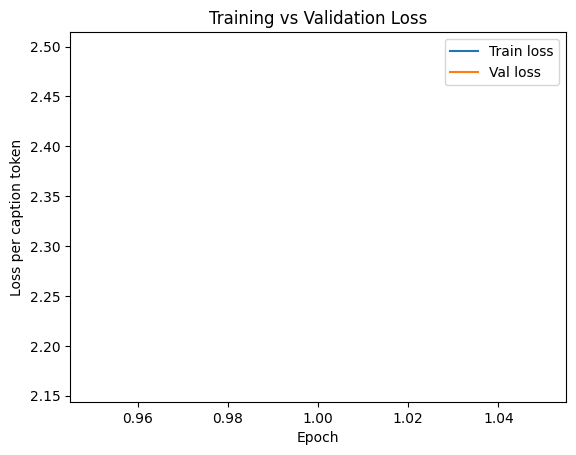

In [95]:
# Part 8.5 – Plot train vs val loss

if len(history["train_loss"]) > 0:
    plt.figure()
    epochs = range(1, len(history["train_loss"]) + 1)
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["val_loss"], label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss per caption token")
    plt.title("Training vs Validation Loss")
    plt.legend()
    plt.show()


### part-9

In [97]:
# Part 9.1 – Inspect norms at different stages for one batch

def inspect_batch_stats(dataset, n_samples: int = 8):
    temp_loader = DataLoader(
        dataset,
        batch_size=min(cfg.batch_size, n_samples),
        shuffle=True,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )

    batch = next(iter(temp_loader))
    perc_dtype = next(perceiver.parameters()).dtype
    
    encoder_feats = batch["encoder_feats"].to(device, dtype=perc_dtype)      # (B, T, D_perc)
    encoder_mask  = batch["encoder_mask"].to(device)
    input_ids     = batch["input_ids"].to(device)

    with torch.no_grad():
        # Perceiver + projector
        latents = perceiver(encoder_feats, encoder_mask=encoder_mask)      # (B, L, D_perc)
        image_tokens_llm = projector(latents)                              # (B, L, D_llm)

        # LLM text embedding stats for comparison
        embed_tokens = llm_model.get_input_embeddings()
        # Sample some real text tokens from the batch:
        flat_ids = input_ids.view(-1)
        text_embs = embed_tokens(flat_ids)                                  # (B*L, D_llm)

    def stats(t):
        t = t.float()
        norms = t.norm(dim=-1).view(-1).cpu().numpy()
        return norms.mean(), norms.std()

    enc_mean, enc_std = stats(encoder_feats)
    lat_mean, lat_std = stats(latents)
    img_mean, img_std = stats(image_tokens_llm)
    txt_mean, txt_std = stats(text_embs)

    print("=== Norm stats (mean ± std) ===")
    print(f"Encoder features   : {enc_mean:.3f} ± {enc_std:.3f}")
    print(f"Perceiver latents  : {lat_mean:.3f} ± {lat_std:.3f}")
    print(f"Projected img toks : {img_mean:.3f} ± {img_std:.3f}")
    print(f"LLM text embeddings: {txt_mean:.3f} ± {txt_std:.3f}")

inspect_batch_stats(train_dataset)


=== Norm stats (mean ± std) ===
Encoder features   : 29.159 ± 41.491
Perceiver latents  : 39.234 ± 0.009
Projected img toks : 64.942 ± 5.400
LLM text embeddings: 0.353 ± 0.174


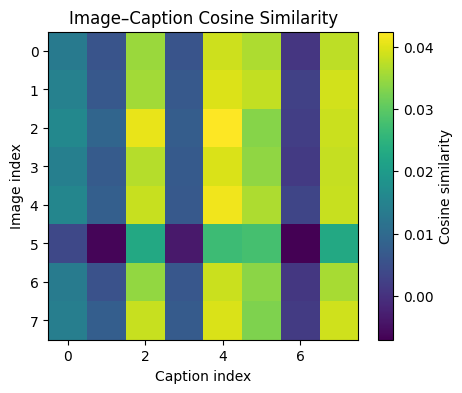

Diagonal (correct pairs) similarities:
[0.013405  0.006496  0.0407    0.00696   0.0413    0.0279    0.0009055
 0.03885  ]
Off-diagonal mean similarity: 0.0208892822265625


In [101]:
# Part 9.2 – Image–text similarity heatmap

import torch.nn.functional as F

def build_img_txt_embeddings(dataset, n_examples: int = 8):
    loader = DataLoader(
        dataset,
        batch_size=n_examples,
        shuffle=True,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )
    batch = next(iter(loader))

    perc_dtype = next(perceiver.parameters()).dtype
    
    encoder_feats = batch["encoder_feats"].to(device, dtype=perc_dtype)      # (B, T, D_perc)
    encoder_mask  = batch["encoder_mask"].to(device)
    captions      = batch["labels"]                        # we only need lengths later
    input_ids     = batch["input_ids"].to(device)

    B = encoder_feats.size(0)

    with torch.no_grad():
        # Image side: Perceiver + projector, then mean over latents
        latents = perceiver(encoder_feats, encoder_mask=encoder_mask)      # (B, L, D_perc)
        img_tokens = projector(latents)                                    # (B, L, D_llm)
        img_emb = img_tokens.mean(dim=1)                                   # (B, D_llm)

        # Text side: mean embedding of caption tokens only
        embed_tokens = llm_model.get_input_embeddings()
        text_emb_list = []
        for b in range(B):
            row_ids = input_ids[b]   # (L,)
            # Caption tokens are where labels != -100
            lbls = batch["labels"][b]
            caption_positions = (lbls != -100).nonzero(as_tuple=False).squeeze(-1)
            if caption_positions.numel() == 0:
                # fallback: use all non-pad tokens
                caption_positions = (row_ids != llm_tokenizer.pad_token_id).nonzero(as_tuple=False).squeeze(-1)

            cap_ids = row_ids[caption_positions].to(device)        # (Nc,)
            cap_embs = embed_tokens(cap_ids)                       # (Nc, D_llm)
            text_emb_list.append(cap_embs.mean(dim=0))             # (D_llm,)

        txt_emb = torch.stack(text_emb_list, dim=0)                # (B, D_llm)

    return img_emb, txt_emb

def plot_img_txt_similarity(dataset, n_examples: int = 8):
    img_emb, txt_emb = build_img_txt_embeddings(dataset, n_examples)
    # 🔑 Ensure same device + dtype
    target_device = txt_emb.device
    target_dtype  = txt_emb.dtype

    img_emb = img_emb.to(device=target_device, dtype=target_dtype)

    # Normalize for cosine
    img_norm = F.normalize(img_emb, dim=-1)
    txt_norm = F.normalize(txt_emb, dim=-1)

    sim = img_norm @ txt_norm.t()  # (B, B)

    plt.figure(figsize=(5, 4))
    plt.imshow(sim.cpu().numpy(), aspect="auto")
    plt.colorbar(label="Cosine similarity")
    plt.xlabel("Caption index")
    plt.ylabel("Image index")
    plt.title("Image–Caption Cosine Similarity")
    plt.show()

    print("Diagonal (correct pairs) similarities:")
    print(sim.diag().cpu().numpy())
    print("Off-diagonal mean similarity:", sim[~torch.eye(sim.size(0), dtype=bool, device=sim.device)].mean().item())

plot_img_txt_similarity(val_dataset, n_examples=8)


In [105]:
# Part 9.3 – Compare caption loss with vs without image

def caption_only_loss(dataset, n_batches: int = 10):
    dl = DataLoader(
        dataset,
        batch_size=cfg.batch_size,
        shuffle=False,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )
    total_loss = 0.0
    total_tokens = 0

    llm_model.eval()
    with torch.no_grad():
        for i, batch in enumerate(dl):
            if i >= n_batches:
                break

            # Build pure caption-only sequences: [BOS] caption [EOS]
            captions = []
            for lbls, ids in zip(batch["labels"], batch["input_ids"]):
                # Reconstruct caption text from labels!= -100
                cap_token_ids = [id_ for id_, l in zip(ids.tolist(), lbls.tolist()) if l != -100]
                text = llm_tokenizer.decode(cap_token_ids, skip_special_tokens=True)
                captions.append(text)

            cap_enc = llm_tokenizer(
                captions,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=512,
            ).to(device)

            # labels = input_ids shifted inside model; we just set labels = input_ids
            labels = cap_enc["input_ids"].clone()
            # Optionally ignore padding
            labels[cap_enc["attention_mask"] == 0] = -100

            out = llm_model(
                input_ids=cap_enc["input_ids"],
                attention_mask=cap_enc["attention_mask"],
                labels=labels,
            )
            loss = out.loss
            num_tokens = (labels != -100).sum().item()
            total_loss += loss.item() * num_tokens
            total_tokens += num_tokens

    return total_loss / max(total_tokens, 1)

def multimodal_loss(dataset, n_batches: int = 10):
    dl = DataLoader(
        dataset,
        batch_size=cfg.batch_size,
        shuffle=False,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )
    total_loss = 0.0
    total_tokens = 0

    perceiver.eval()
    projector.eval()
    llm_model.eval()

    with torch.no_grad():
        for i, batch in enumerate(dl):
            if i >= n_batches:
                break

            loss, aux = forward_batch(batch)
            total_loss += loss.item() * aux["num_caption_tokens"]
            total_tokens += aux["num_caption_tokens"]

    return total_loss / max(total_tokens, 1)

cap_loss = caption_only_loss(val_dataset, n_batches=10)
mm_loss  = multimodal_loss(val_dataset, n_batches=10)

print(f"Caption-only loss (frozen LLM): {cap_loss:.4f}")
print(f"Multimodal loss (with image):  {mm_loss:.4f}")


Caption-only loss (frozen LLM): 2.3505
Multimodal loss (with image):  2.1393


In [106]:
# Part 9.4 – Generation helper (image-conditioned caption)

def generate_with_image(example_idx: int, max_new_tokens: int = 40):
    # 1. Load cached features + caption
    ex = train_dataset[example_idx]
    feats = ex["features"].to(device, dtype=torch.float32)          # (T, D_perc)
    caption_gt = ex["caption"]

    # 2. Build encoder batch of size 1
    encoder_feats = feats.unsqueeze(0)         # (1, T, D_perc)
    encoder_mask = torch.ones(1, feats.size(0), dtype=torch.long, device=device)

    with torch.no_grad():
        latents = perceiver(encoder_feats, encoder_mask=encoder_mask)  # (1, L, D_perc)
        img_tokens = projector(latents)                                # (1, L, D_llm)

    # 3. Build text prompt: [BOS] <image_start> <image_patch>×L <image_end> "A photo of"
    prompt_text = "A photo of"
    prompt_ids = llm_tokenizer(prompt_text, add_special_tokens=False)["input_ids"]

    input_ids = []
    input_ids.append(bos_id)
    input_ids.append(image_start_id)
    input_ids.extend([image_patch_id] * cfg.num_latents)
    input_ids.append(image_end_id)
    input_ids.extend(prompt_ids)

    input_ids = torch.tensor(input_ids, dtype=torch.long, device=device).unsqueeze(0)  # (1, L0)
    attention_mask = torch.ones_like(input_ids, device=device)

    # 4. Inject image embeddings into <image_patch> positions to get initial inputs_embeds
    with torch.no_grad():
        inputs_embeds = inject_image_embeddings(input_ids, img_tokens)  # (1, L0, D_llm)

    # 5. Use generate with inputs_embeds. We pass input_ids only to satisfy generate,
    #    but embeddings are what matter for the prefix.
    gen_out = llm_model.generate(
        inputs_embeds=inputs_embeds,
        attention_mask=attention_mask,
        max_new_tokens=max_new_tokens,
        do_sample=False,
        pad_token_id=llm_tokenizer.pad_token_id,
        eos_token_id=llm_tokenizer.eos_token_id,
    )

    # gen_out is token ids for the full sequence (prefix + new tokens)
    gen_ids = gen_out[0].tolist()

    # Drop the prefix tokens (BOS, image markers, prompt) when decoding:
    prefix_len = input_ids.size(1)
    new_token_ids = gen_ids[prefix_len:]
    gen_text = llm_tokenizer.decode(new_token_ids, skip_special_tokens=True)

    print("=== Ground Truth Caption (truncated) ===")
    print(caption_gt[:300] + ("..." if len(caption_gt) > 300 else ""))
    print("\n=== Generated (image-conditioned) ===")
    print(gen_text.strip())


# Try generation on a few examples
for idx in [0, 1, 2]:
    print(f"\n######## Example {idx} ########")
    generate_with_image(idx, max_new_tokens=40)



######## Example 0 ########


=== Ground Truth Caption (truncated) ===
The image depicts a pixelated, retro-style space shooter game set against a night sky backdrop. At the bottom center of the screen, a player-controlled spaceship is visible, continuously firing small pellets upward at various alien enemies in the sky. In the lower-left corner, a green, squid-like cr...

=== Generated (image-conditioned) ===


######## Example 1 ########
=== Ground Truth Caption (truncated) ===
The book cover is intricately designed with a generally dark red background framed by a light brown border. The central focal point is a fan-like shape in mostly beige, bearing the title "The Steampunk Bible" in black text. Beneath the title, also arranged in an arc to mimic the fan, is the author’s...

=== Generated (image-conditioned) ===


######## Example 2 ########
=== Ground Truth Caption (truncated) ===
In this captivating photograph, a calico cat with predominantly black fur is shown resting serenely. The feline's distinct calico p

### Part-10

In [108]:
# Part 10.1 – Masked mean over time (patch) dimension

def masked_mean_time(x: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
    """
    x:    (B, T, D)
    mask: (B, T) with 1 = valid, 0 = pad
    returns:
        (B, D) mean over valid tokens
    """
    mask = mask.unsqueeze(-1).to(x.dtype)      # (B, T, 1)
    x_sum = (x * mask).sum(dim=1)              # (B, D)
    lengths = mask.sum(dim=1).clamp(min=1.0)   # (B, 1)
    return x_sum / lengths


In [109]:
# Part 10.2 – Baseline: mean pool + linear to LLM space

class MeanPoolImageModule(nn.Module):
    def __init__(self, in_dim: int, out_dim: int, num_latents: int):
        super().__init__()
        self.num_latents = num_latents
        self.proj = nn.Linear(in_dim, out_dim)

    def forward(self, encoder_feats, encoder_mask):
        """
        encoder_feats: (B, T, D_in)
        encoder_mask:  (B, T)
        returns:
            image_tokens_llm: (B, num_latents, out_dim)
        """
        # 1) Masked mean over time
        pooled = masked_mean_time(encoder_feats, encoder_mask)   # (B, D_in)

        # 2) Repeat to num_latents
        B, D_in = pooled.shape
        pooled_repeated = pooled.unsqueeze(1).expand(B, self.num_latents, D_in)  # (B, L, D_in)

        # 3) Project to LLM dim
        image_tokens_llm = self.proj(pooled_repeated)             # (B, L, out_dim)
        return image_tokens_llm


In [110]:
# Instantiate baseline ablation module

baseline_image_module = MeanPoolImageModule(
    in_dim=cfg.perceiver_dim,    # same dim as concatenated patch features
    out_dim=llm_hidden_size,
    num_latents=cfg.num_latents,
).to(device)

baseline_trainable_params = [p for p in baseline_image_module.parameters() if p.requires_grad]
print("Baseline trainable params:", sum(p.numel() for p in baseline_trainable_params) / 1e6, "M")


Baseline trainable params: 3.147776 M


In [114]:
# Part 10.3 – Generic forward using an arbitrary image_module

def make_image_module_main():
    """
    Returns a function image_module(feats, mask) for the full Perceiver + projector pipeline.
    """
    def image_module(encoder_feats, encoder_mask):
        latents = perceiver(encoder_feats, encoder_mask=encoder_mask)    # (B, L, D_perc)
        return projector(latents)                                        # (B, L, D_llm)
    return image_module

def make_image_module_baseline():
    """
    Returns the baseline module (mean pool + linear).
    """
    return baseline_image_module

def forward_batch_generic(batch, image_module):
    """
    batch: dict from collate_pixmo_batch
    image_module: callable(encoder_feats, encoder_mask) -> image_tokens_llm (B, L, D_llm)
    """
    # Move to device
    perc_dtype = next(perceiver.parameters()).dtype
    encoder_feats = batch["encoder_feats"].to(device, perc_dtype)      # (B, T, D_perc)
    encoder_mask  = batch["encoder_mask"].to(device)       # (B, T)
    input_ids     = batch["input_ids"].to(device)          # (B, L)
    attention_mask= batch["attention_mask"].to(device)     # (B, L)
    labels        = batch["labels"].to(device)             # (B, L)

    # 1) Get image tokens in LLM space via chosen module
    image_tokens_llm = image_module(encoder_feats, encoder_mask)         # (B, num_latents, D_llm)

    # 2) Inject into embeddings
    inputs_embeds = inject_image_embeddings(input_ids, image_tokens_llm)

    # 3) Frozen LLM forward
    outputs = llm_model(
        inputs_embeds=inputs_embeds,
        attention_mask=attention_mask,
        labels=labels,
    )
    loss = outputs.loss

    with torch.no_grad():
        num_tokens = (labels != -100).sum().item()

    aux = {"num_caption_tokens": num_tokens}
    return loss, aux


In [115]:
# Part 10.4 – Generic train/eval loop for ablation experiments

def train_model_with_image_module(
    image_module,
    trainable_params,
    num_epochs: int,
    run_name: str,
    lr: float = 1e-4,
):
    # DataLoaders
    train_loader_local = DataLoader(
        train_dataset,
        batch_size=cfg.batch_size,
        shuffle=True,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )
    val_loader_local = DataLoader(
        val_dataset,
        batch_size=cfg.batch_size,
        shuffle=False,
        collate_fn=lambda b: collate_pixmo_batch(b, num_latents=cfg.num_latents),
    )

    optimizer = torch.optim.AdamW(
        trainable_params,
        lr=lr,
        weight_decay=cfg.weight_decay,
    )

    steps_per_epoch = len(train_loader_local)
    max_train_steps = steps_per_epoch * num_epochs

    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=cfg.warmup_steps,
        num_training_steps=max_train_steps,
    )

    history = {"train_loss": [], "val_loss": []}

    for epoch in range(1, num_epochs + 1):
        print(f"\n[{run_name}] Epoch {epoch}/{num_epochs}")
        # ---- Train ----
        for p in trainable_params:
            p.requires_grad_(True)
        perceiver.eval()   # we won't use perceiver for baseline; for main run you can set it trainable separately
        projector.eval()   # same note; we'll control outside

        running_loss = 0.0
        running_tokens = 0

        pbar = tqdm(train_loader_local, desc=f"{run_name} – train epoch {epoch}")
        for batch in pbar:
            optimizer.zero_grad()
            loss, aux = forward_batch_generic(batch, image_module)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(trainable_params, cfg.max_grad_norm)
            optimizer.step()
            scheduler.step()

            running_loss += loss.item() * aux["num_caption_tokens"]
            running_tokens += aux["num_caption_tokens"]

            avg_loss = running_loss / max(running_tokens, 1)
            pbar.set_postfix({"loss": f"{avg_loss:.3f}"})

        train_loss = running_loss / max(running_tokens, 1)

        # ---- Eval ----
        for p in trainable_params:
            p.requires_grad_(False)

        perceiver.eval()
        projector.eval()

        val_running_loss = 0.0
        val_tokens = 0

        with torch.no_grad():
            for batch in tqdm(val_loader_local, desc=f"{run_name} – val epoch {epoch}"):
                loss, aux = forward_batch_generic(batch, image_module)
                val_running_loss += loss.item() * aux["num_caption_tokens"]
                val_tokens += aux["num_caption_tokens"]

        val_loss = val_running_loss / max(val_tokens, 1)

        print(f"[{run_name}] Epoch {epoch} – train loss: {train_loss:.4f} | val loss: {val_loss:.4f}")
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)

    return history


In [116]:
# Run a quick baseline experiment (mean pool)

num_epochs_ablation = 1  # start with 1, you can increase

baseline_history = train_model_with_image_module(
    image_module=make_image_module_baseline(),
    trainable_params=baseline_trainable_params,
    num_epochs=num_epochs_ablation,
    run_name="meanpool_baseline",
    lr=cfg.learning_rate,
)



[meanpool_baseline] Epoch 1/1


meanpool_baseline – train epoch 1:   0%|          | 0/546 [00:00<?, ?it/s]

meanpool_baseline – val epoch 1:   0%|          | 0/57 [00:00<?, ?it/s]

[meanpool_baseline] Epoch 1 – train loss: 2.8116 | val loss: 2.1825


In [117]:
# Prepare trainable params for main Perceiver + projector model

perceiver_params = list(perceiver.parameters())
projector_params = list(projector.parameters())
main_trainable_params = [p for p in perceiver_params + projector_params if p.requires_grad]

image_module_main = make_image_module_main()

perceiver_history = train_model_with_image_module(
    image_module=image_module_main,
    trainable_params=main_trainable_params,
    num_epochs=num_epochs_ablation,
    run_name="perceiver_main",
    lr=cfg.learning_rate,
)



[perceiver_main] Epoch 1/1


perceiver_main – train epoch 1:   0%|          | 0/546 [00:00<?, ?it/s]

perceiver_main – val epoch 1:   0%|          | 0/57 [00:00<?, ?it/s]

[perceiver_main] Epoch 1 – train loss: 2.1654 | val loss: 2.1340


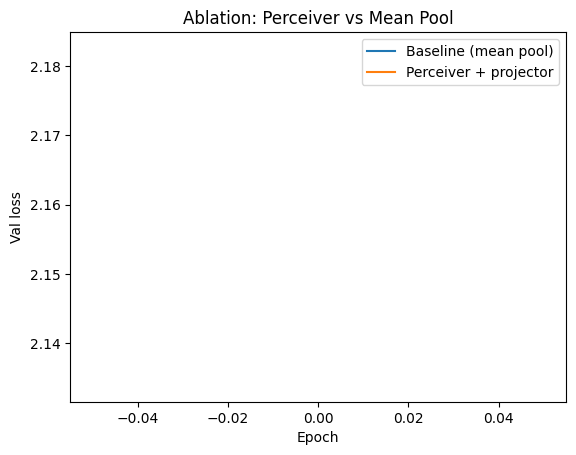

In [118]:
# Compare validation loss curves of baseline vs perceiver (if both run)

plt.figure()
if "val_loss" in baseline_history:
    plt.plot(baseline_history["val_loss"], label="Baseline (mean pool)")
if "val_loss" in perceiver_history:
    plt.plot(perceiver_history["val_loss"], label="Perceiver + projector")
plt.xlabel("Epoch")
plt.ylabel("Val loss")
plt.title("Ablation: Perceiver vs Mean Pool")
plt.legend()
plt.show()
